# Store Item Demand Forecasting Challenge

Our first idea is to use a Kaggle competition [dataset](https://www.kaggle.com/c/demand-forecasting-kernels-only) to explore different time series techniques. There are 5 years of store-item sales data. Our task is to predict 3 months of sales for 50 different items at 10 different stores while taking into account seasonality. We can also model the stores together.

We can provide insight on specific items at each store. For example, one store may be located in a region heavy in the farming industry, so item 4 (mulch) may have higher demand there versus other stores.

The questions we are posing for the model to solve are:

1. Can we avoid potential stock outs by predicting demand accurately.
2. Which items are more in demand seasonally and can we find out why?


### Data Available
The data is split into training and testing sets (17.84MB):

- Date - date of sale (Continuous)
- Store - store ID (Categorical)
- Item - item ID (Categorical)
- Sales - items sold at store on date (Continuous)


### Approaches
The possible approaches are:
- Basic regression models
- Decision Trees, Random Forests, etc.
- Neural Networks using MLP
- Simultaneously Reconciled Quantile Forecasting of Hierarchically Related Time Series

We want to test if the NN works better for demand forecasting than other models and why is that?


# Data Pre-processing

In [86]:
import pandas as pd
import numpy as np
from sklearn.model_selection import (train_test_split,KFold)
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime as dt
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_absolute_error
import lightgbm as lgb
#!pip install xgboost
import xgboost as xgb
import copy
%matplotlib inline

In [87]:
test = pd.read_csv('test.csv')
train = pd.read_csv('train.csv')
sample = pd.read_csv('sample_submission.csv')

In [88]:
test1 = copy.deepcopy(test)
train1 = copy.deepcopy(train)

In [89]:
sample.head()

,id,sales
0,0,52
1,1,52
2,2,52
3,3,52
4,4,52


In [90]:
print(test.shape)
test.head()

(45000, 4)


,id,date,store,item
0,0,2018-01-01,1,1
1,1,2018-01-02,1,1
2,2,2018-01-03,1,1
3,3,2018-01-04,1,1
4,4,2018-01-05,1,1


In [91]:
print(train.shape)
train.head()

(913000, 4)


,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10


In [92]:
train['date']=pd.to_datetime(train['date'], infer_datetime_format=True)
test['date']=pd.to_datetime(test['date'], infer_datetime_format=True)
train['year'] = train['date'].dt.year
train['month'] = train['date'].dt.month
train['day'] = train['date'].dt.day
train['week'] = train['date'].dt.week
train['weekofyear'] = train['date'].dt.weekofyear
train['dayofweek'] = train['date'].dt.dayofweek
train['weekday'] = train['date'].dt.weekday
train['dayofyear'] = train['date'].dt.dayofyear
train['quarter'] = train['date'].dt.quarter
train['is_month_start'] = train['date'].dt.is_month_start
train['is_month_end'] =train['date'].dt.is_month_end
train['is_quarter_start'] = train['date'].dt.is_quarter_start
train['is_quarter_end'] = train['date'].dt.is_quarter_end
train['is_year_start'] = train['date'].dt.is_year_start
train['is_year_end'] = train['date'].dt.is_year_end
train['daily_avg']=train.groupby(['item','store','dayofweek'])['sales'].transform('mean')
train['monthly_avg']=train.groupby(['item','store','month'])['sales'].transform('mean')
train["mean_store_item_month"] = train.groupby(['month',"item","store"])["sales"].transform("mean")
train["item_month_sum"] = train.groupby(['month',"item"])["sales"].transform("sum") # total sales of that item  for all stores
train["store_month_sum"] = train.groupby(['month',"store"])["sales"].transform("sum") # total sales of that store  for all items
#train['store_item_shifted_365'] = train.groupby(["item","store"])['sales'].transform(lambda x:x.shift(365)) # sales for that 1 year  ago
#train["item-week_shifted_90"] = train.groupby(['weekofyear',"item"])["sales"].transform(lambda x:x.shift(12).sum()) # shifted total sales for that item 12 weeks (3 months) ago
#train['store_item_shifted_365'].fillna(train['store_item_shifted_365'].mode()[0], inplace=True)
daily_avg=train.groupby(['item','store','dayofweek'])['sales'].mean().reset_index()
monthly_avg=train.groupby(['item','store','month'])['sales'].mean().reset_index()
mean_store_item_month = train.groupby(['month','item','store'])['sales'].mean().reset_index()
item_month_sum=train.groupby(['month','item'])['sales'].sum().reset_index()
store_month_sum=train.groupby(['month','store'])['sales'].sum().reset_index()
#store_item_shifted_365=train.groupby(['item','store'])['sales'].shift(365).reset_index
#item_week_shifted_90=train.groupby(['weekofyear','item','dayofweek'])['sales'].shift(12).reset_index()
train.dtypes

date                     datetime64[ns]
store                             int64
item                              int64
sales                             int64
year                              int64
month                             int64
day                               int64
week                              int64
weekofyear                        int64
dayofweek                         int64
weekday                           int64
dayofyear                         int64
quarter                           int64
is_month_start                     bool
is_month_end                       bool
is_quarter_start                   bool
is_quarter_end                     bool
is_year_start                      bool
is_year_end                        bool
daily_avg                       float64
monthly_avg                     float64
mean_store_item_month           float64
item_month_sum                    int64
store_month_sum                   int64
dtype: object

In [93]:
#Create mask for boolean values for train dataset
train['is_month_start'] = train['is_month_start'].replace({True: 1, False: 0})
train['is_month_end'] = train['is_month_end'].replace({True: 1, False: 0})
train['is_quarter_start'] = train['is_quarter_start'].replace({True: 1, False: 0})
train['is_quarter_end'] = train['is_quarter_end'].replace({True: 1, False: 0})
train['is_year_start'] = train['is_year_start'].replace({True: 1, False: 0})
train['is_year_end'] = train['is_year_end'].replace({True: 1, False: 0})

#convert float to int
train['daily_avg']=train['daily_avg'].astype(np.int64)
train['monthly_avg']=train['monthly_avg'].astype(np.int64)
train['mean_store_item_month']=train['mean_store_item_month'].astype(np.int64)
#train['store_item_shifted_365']=train['store_item_shifted_365'].astype(np.int64)
train.dtypes

date                     datetime64[ns]
store                             int64
item                              int64
sales                             int64
year                              int64
month                             int64
day                               int64
week                              int64
weekofyear                        int64
dayofweek                         int64
weekday                           int64
dayofyear                         int64
quarter                           int64
is_month_start                    int64
is_month_end                      int64
is_quarter_start                  int64
is_quarter_end                    int64
is_year_start                     int64
is_year_end                       int64
daily_avg                         int64
monthly_avg                       int64
mean_store_item_month             int64
item_month_sum                    int64
store_month_sum                   int64
dtype: object

In [94]:
train.head()

,date,store,item,sales,year,month,day,week,weekofyear,dayofweek,...,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,daily_avg,monthly_avg,mean_store_item_month,item_month_sum,store_month_sum
0,2013-01-01,1,1,13,2013,1,1,1,1,1,...,0,1,0,1,0,18,13,13,22987,249352
1,2013-01-02,1,1,11,2013,1,2,1,1,2,...,0,0,0,0,0,18,13,13,22987,249352
2,2013-01-03,1,1,14,2013,1,3,1,1,3,...,0,0,0,0,0,19,13,13,22987,249352
3,2013-01-04,1,1,13,2013,1,4,1,1,4,...,0,0,0,0,0,21,13,13,22987,249352
4,2013-01-05,1,1,10,2013,1,5,1,1,5,...,0,0,0,0,0,22,13,13,22987,249352


In [95]:
test['year'] = test['date'].dt.year
test['month'] = test['date'].dt.month
test['day'] = test['date'].dt.day
test['week'] = test['date'].dt.week
test['weekofyear'] = test['date'].dt.weekofyear
test['dayofweek'] = test['date'].dt.dayofweek
test['weekday'] = test['date'].dt.weekday
test['dayofyear'] = test['date'].dt.dayofyear
test['quarter'] = test['date'].dt.quarter
test['is_month_start'] = test['date'].dt.is_month_start
test['is_month_end']= test['date'].dt.is_month_end
test['is_quarter_start'] = test['date'].dt.is_quarter_start
test['is_quarter_end'] = test['date'].dt.is_quarter_end
test['is_year_start'] = test['date'].dt.is_year_start
test['is_year_end'] = test['date'].dt.is_year_end
test.dtypes

id                           int64
date                datetime64[ns]
store                        int64
item                         int64
year                         int64
month                        int64
day                          int64
week                         int64
weekofyear                   int64
dayofweek                    int64
weekday                      int64
dayofyear                    int64
quarter                      int64
is_month_start                bool
is_month_end                  bool
is_quarter_start              bool
is_quarter_end                bool
is_year_start                 bool
is_year_end                   bool
dtype: object

In [96]:
#Create mask for boolean values for test dataset
test['is_month_start'] = test['is_month_start'].replace({True: 1, False: 0})
test['is_month_end'] = test['is_month_end'].replace({True: 1, False: 0})
test['is_quarter_start'] = test['is_quarter_start'].replace({True: 1, False: 0})
test['is_quarter_end'] = test['is_quarter_end'].replace({True: 1, False: 0})
test['is_year_start'] = test['is_year_start'].replace({True: 1, False: 0})
test['is_year_end'] = test['is_year_end'].replace({True: 1, False: 0})
test['is_year_end'] = test['is_year_end'].astype(str).astype(np.int64)

#Add sales column with merge/join function to test data
def merge(x,y,col,col_name):
    x =pd.merge(x, y, how='left', on=None, left_on=col, right_on=col,
            left_index=False, right_index=False, sort=True,
             copy=True, indicator=False,validate=None)
    
    x=x.rename(columns={'sales':col_name})
    return x

test=merge(test, daily_avg,['item','store','dayofweek'],'daily_avg')
test=merge(test, monthly_avg,['item','store','month'],'monthly_avg')
test=merge(test, mean_store_item_month, ['month','item','store'],'mean_store_item_month')
test=merge(test, item_month_sum,['month','item'],'item_month_sum')
test=merge(test, store_month_sum,['month','store'],'store_month_sum')
#test=merge(test, store_item_shifted_365,['item','store'],'store_item_shifted_365')
#test=merge(test, item_week_shifted_90,['weekofyear', 'item'],'item-week_shifted_90')

#convert float to int
test['daily_avg']=test['daily_avg'].astype(np.int64)
test['monthly_avg']=test['monthly_avg'].astype(np.int64)
test['mean_store_item_month']=test['mean_store_item_month'].astype(np.int64)
#test['store_item_shifted_365']=test['store_item_shifted_365'].astype(np.int64)
test.dtypes

id                                int64
date                     datetime64[ns]
store                             int64
item                              int64
year                              int64
month                             int64
day                               int64
week                              int64
weekofyear                        int64
dayofweek                         int64
weekday                           int64
dayofyear                         int64
quarter                           int64
is_month_start                    int64
is_month_end                      int64
is_quarter_start                  int64
is_quarter_end                    int64
is_year_start                     int64
is_year_end                       int64
daily_avg                         int64
monthly_avg                       int64
mean_store_item_month             int64
item_month_sum                    int64
store_month_sum                   int64
dtype: object

In [97]:
test.head()

,id,date,store,item,year,month,day,week,weekofyear,dayofweek,...,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,daily_avg,monthly_avg,mean_store_item_month,item_month_sum,store_month_sum
0,0,2018-01-01,1,1,2018,1,1,1,1,0,...,0,1,0,1,0,15,13,13,22987,249352
1,7,2018-01-08,1,1,2018,1,8,2,2,0,...,0,0,0,0,0,15,13,13,22987,249352
2,14,2018-01-15,1,1,2018,1,15,3,3,0,...,0,0,0,0,0,15,13,13,22987,249352
3,21,2018-01-22,1,1,2018,1,22,4,4,0,...,0,0,0,0,0,15,13,13,22987,249352
4,28,2018-01-29,1,1,2018,1,29,5,5,0,...,0,0,0,0,0,15,13,13,22987,249352


In [98]:
# As we can see there are no missing values.
train_NA = train.isna()
train_num_NA = train_NA.sum()
train_num_NA

date                     0
store                    0
item                     0
sales                    0
year                     0
month                    0
day                      0
week                     0
weekofyear               0
dayofweek                0
weekday                  0
dayofyear                0
quarter                  0
is_month_start           0
is_month_end             0
is_quarter_start         0
is_quarter_end           0
is_year_start            0
is_year_end              0
daily_avg                0
monthly_avg              0
mean_store_item_month    0
item_month_sum           0
store_month_sum          0
dtype: int64

In [99]:
print('Min date from train set: %s' % train['date'].min().date())
print('Max date from train set: %s' % train['date'].max().date())

Min date from train set: 2013-01-01
Max date from train set: 2017-12-31


In [100]:
lag_size = (test['date'].max().date() - train['date'].max().date()).days
print('Max date from train set: %s' % train['date'].max().date())
print('Max date from test set: %s' % test['date'].max().date())
print('Forecast lag size', lag_size)

Max date from train set: 2017-12-31
Max date from test set: 2018-03-31
Forecast lag size 90


# Data Visualizations

Skew Dist: 0.8671122960235805
Kurtosis Dist: 0.5090704757198172
We can see that our data is skewed to the right


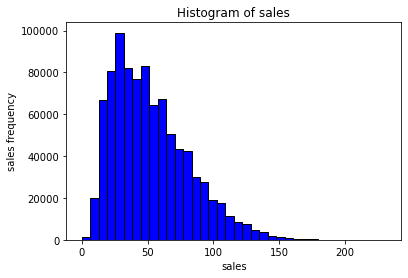

In [101]:
plt.hist(train['sales'], color = 'blue', edgecolor = 'black',
         bins = int(180/5))


plt.title('Histogram of sales')
plt.xlabel('sales')
plt.ylabel('sales frequency')

print('Skew Dist:',train['sales'].skew())
print('Kurtosis Dist:',train['sales'].kurt())
print("We can see that our data is skewed to the right")

Skew Dist: -0.375579598747413
Kurtosis Dist: -0.2389747199181107


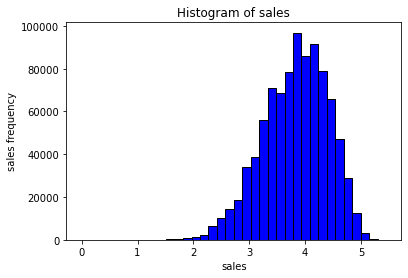

In [102]:
#Take log of sales to reduce skewness
train['sales'] = np.log1p(train.sales)


plt.hist(train['sales'], color = 'blue', edgecolor = 'black',
         bins = int(180/5))

plt.title('Histogram of sales')
plt.xlabel('sales')
plt.ylabel('sales frequency')

print('Skew Dist:',train['sales'].skew())
print('Kurtosis Dist:',train['sales'].kurt())

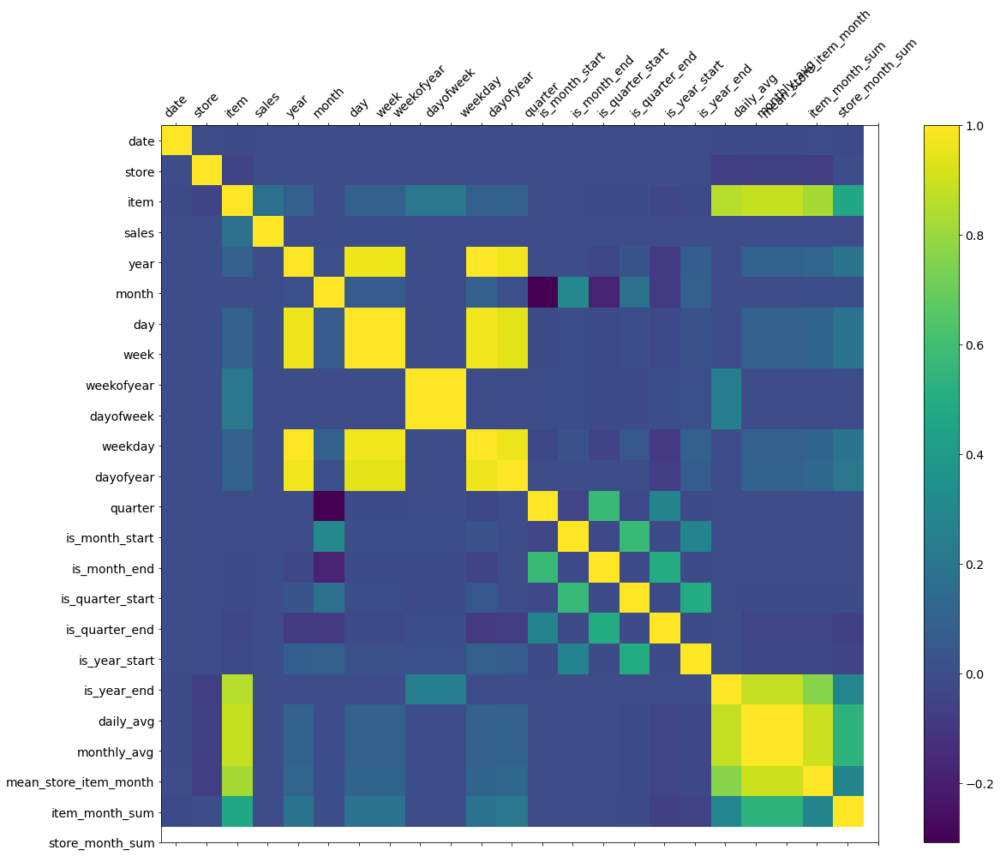

In [103]:
f = plt.figure(figsize=(19, 15))
plt.matshow(train.corr(), fignum=f.number)
plt.xticks(range(train.shape[1]), train.columns, fontsize=14, rotation=45)
plt.yticks(range(train.shape[1]), train.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)

In [104]:
import plotly.offline as pyo
pyo.init_notebook_mode()
daily_sales = train.groupby('date', as_index=False)['sales'].sum()
store_daily_sales = train.groupby(['store', 'date'], as_index=False)['sales'].sum()
item_daily_sales = train.groupby(['item', 'date'], as_index=False)['sales'].sum()

In [105]:
daily_sales_sc = go.Scatter(x=daily_sales['date'], y=daily_sales['sales'])
layout = go.Layout(title='Daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=[daily_sales_sc], layout=layout)
iplot(fig)

In [106]:
store_daily_sales_sc = []
for store in store_daily_sales['store'].unique():
    current_store_daily_sales = store_daily_sales[(store_daily_sales['store'] == store)]
    store_daily_sales_sc.append(go.Scatter(x=current_store_daily_sales['date'], y=current_store_daily_sales['sales'], name=('Store %s' % store)))

layout = go.Layout(title='Store daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=store_daily_sales_sc, layout=layout)
iplot(fig)

In [107]:
item_daily_sales_sc = []
for item in item_daily_sales['item'].unique():
    current_item_daily_sales = item_daily_sales[(item_daily_sales['item'] == item)]
    item_daily_sales_sc.append(go.Scatter(x=current_item_daily_sales['date'], y=current_item_daily_sales['sales'], name=('Item %s' % item)))

layout = go.Layout(title='Item daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=item_daily_sales_sc, layout=layout)
iplot(fig)

It appears July is the high and January is a low each year, so there is quite a bit of seasonality. As we breakdown from overal sales, to store, and then item, we can see that the seasonality is the same for all stores and many of the items.

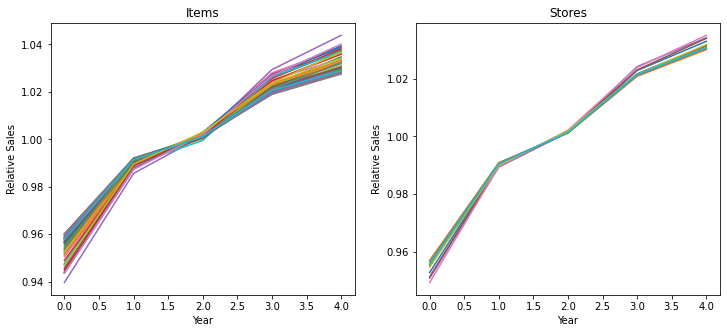

All items and stores seem to enjoy a similar growth in sales over the years.


In [108]:
agg_year_item = pd.pivot_table(train, index='year', columns='item',
                               values='sales', aggfunc=np.mean).values
agg_year_store = pd.pivot_table(train, index='year', columns='store',
                                values='sales', aggfunc=np.mean).values

plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.plot(agg_year_item / agg_year_item.mean(0)[np.newaxis])
plt.title("Items")
plt.xlabel("Year")
plt.ylabel("Relative Sales")
plt.subplot(122)
plt.plot(agg_year_store / agg_year_store.mean(0)[np.newaxis])
plt.title("Stores")
plt.xlabel("Year")
plt.ylabel("Relative Sales")
plt.show()
print("All items and stores seem to enjoy a similar growth in sales over the years.")

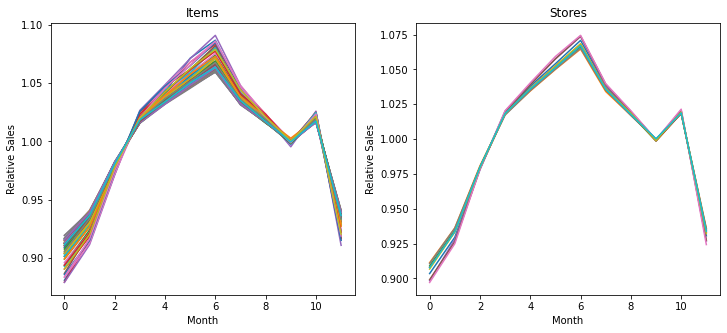

All items and stores seem to share a common pattern in sales over the months as well.


In [109]:
agg_month_item = pd.pivot_table(train, index='month', columns='item',
                                values='sales', aggfunc=np.mean).values
agg_month_store = pd.pivot_table(train, index='month', columns='store',
                                 values='sales', aggfunc=np.mean).values

plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.plot(agg_month_item / agg_month_item.mean(0)[np.newaxis])
plt.title("Items")
plt.xlabel("Month")
plt.ylabel("Relative Sales")
plt.subplot(122)
plt.plot(agg_month_store / agg_month_store.mean(0)[np.newaxis])
plt.title("Stores")
plt.xlabel("Month")
plt.ylabel("Relative Sales")
plt.show()
print("All items and stores seem to share a common pattern in sales over the months as well.")

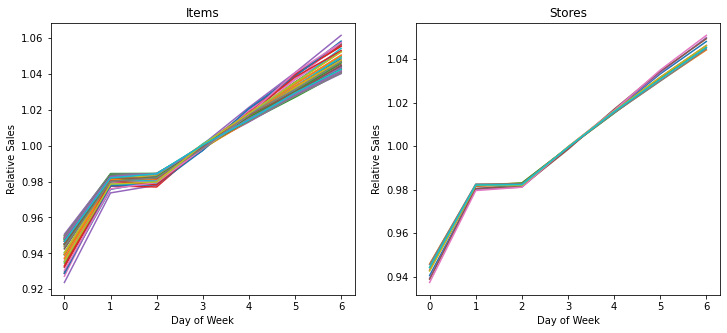

All items and stores also seem to share a common pattern in sales over the days of the week as well.


In [110]:
agg_dow_item = pd.pivot_table(train, index='dayofweek', columns='item',
                              values='sales', aggfunc=np.mean).values
agg_dow_store = pd.pivot_table(train, index='dayofweek', columns='store',
                               values='sales', aggfunc=np.mean).values

plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.plot(agg_dow_item / agg_dow_item.mean(0)[np.newaxis])
plt.title("Items")
plt.xlabel("Day of Week")
plt.ylabel("Relative Sales")
plt.subplot(122)
plt.plot(agg_dow_store / agg_dow_store.mean(0)[np.newaxis])
plt.title("Stores")
plt.xlabel("Day of Week")
plt.ylabel("Relative Sales")
plt.show()
print("All items and stores also seem to share a common pattern in sales over the days of the week as well.")

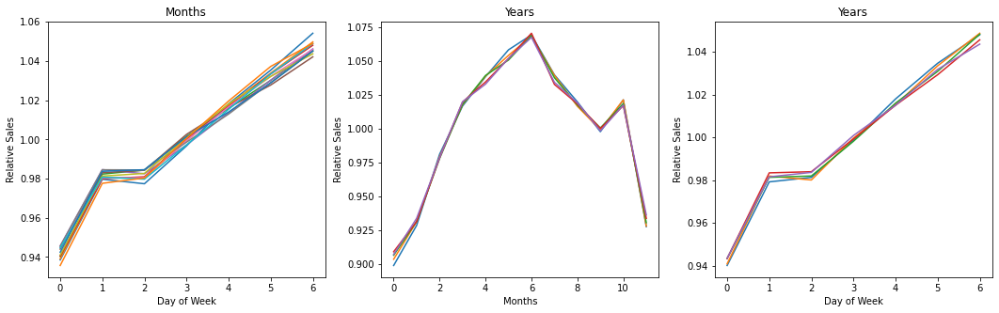

Not checking for degeneracies in the data can lead to missing important trends in complex datasets. For example, when looking at the monthly patterns, we average over all days of the month, years and either items or stores. But what if sales have a multi-dimensional dependence on two of these parameters that isn't easily separable? So, always check for degeneracies in the data!


In [111]:
agg_dow_month = pd.pivot_table(train, index='dayofweek', columns='month',
                               values='sales', aggfunc=np.mean).values
agg_month_year = pd.pivot_table(train, index='month', columns='year',
                                values='sales', aggfunc=np.mean).values
agg_dow_year = pd.pivot_table(train, index='dayofweek', columns='year',
                              values='sales', aggfunc=np.mean).values

plt.figure(figsize=(18, 5))
plt.subplot(131)
plt.plot(agg_dow_month / agg_dow_month.mean(0)[np.newaxis])
plt.title("Months")
plt.xlabel("Day of Week")
plt.ylabel("Relative Sales")
plt.subplot(132)
plt.plot(agg_month_year / agg_month_year.mean(0)[np.newaxis])
plt.title("Years")
plt.xlabel("Months")
plt.ylabel("Relative Sales")
plt.subplot(133)
plt.plot(agg_dow_year / agg_dow_year.mean(0)[np.newaxis])
plt.title("Years")
plt.xlabel("Day of Week")
plt.ylabel("Relative Sales")
plt.show()
print("Not checking for degeneracies in the data can lead to \
missing important trends in complex datasets. For example, when looking at the monthly \
patterns, we average over all days of the month, years and either items or stores. But \
what if sales have a multi-dimensional dependence on two of these parameters that isn't \
easily separable? So, always check for degeneracies in the data!")

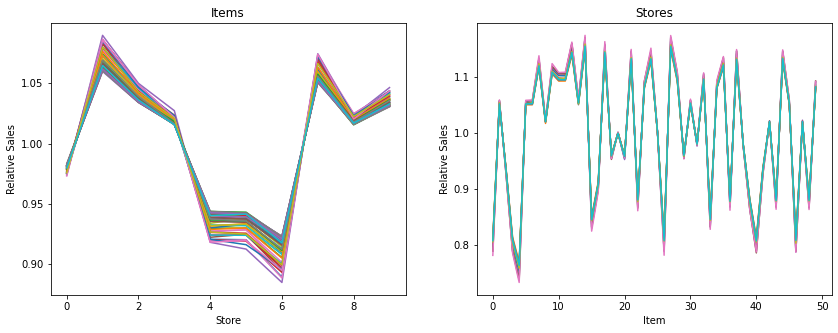

Same here. Just a constant pattern and no degeneracies. So, you just need a model for how items sell at different stores, which is easily captured by an average sales look-up table or yet another relative sales pattern model.


In [112]:
agg_store_item = pd.pivot_table(train, index='store', columns='item',
                                values='sales', aggfunc=np.mean).values

plt.figure(figsize=(14, 5))
plt.subplot(121)
plt.plot(agg_store_item / agg_store_item.mean(0)[np.newaxis])
plt.title("Items")
plt.xlabel("Store")
plt.ylabel("Relative Sales")
plt.subplot(122)
plt.plot(agg_store_item.T / agg_store_item.T.mean(0)[np.newaxis])
plt.title("Stores")
plt.xlabel("Item")
plt.ylabel("Relative Sales")
plt.show()
print("Same here. Just a constant pattern and no degeneracies. \
So, you just need a model for how items sell at different stores, \
which is easily captured by an average sales look-up table or \
yet another ""relative sales"" pattern model.")

In [113]:
test= test.drop(['date','id'], axis = 1)
train= train.drop(['date'], axis = 1)

# Modeling

## Regression

### OLS Regression

y = train['sales'].values
X = train.drop(['sales'], axis = 1)
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.20, random_state=1)

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

from sklearn import linear_model
from sklearn.metrics import mean_absolute_error, r2_score
# Create linear regression object
reg = linear_model.LinearRegression()
# Train the model using the training sets
reg.fit(X_train, y_train)
# Make predictions using the testing set
pred_train = reg.predict(X_train)
pred_test = reg.predict(X_test)

# The mean absolute error
print('Mean absolute error test: %.2f'% mean_absolute_error(y_test, pred_test))
print('Mean absolute error train: %.2f'% mean_absolute_error(y_train, pred_train))
# The coefficient of determination: 1 is perfect prediction
print('R-Squared test: %.2f'% r2_score(y_test, pred_test))
print('R-Squared train: %.2f'% r2_score(y_train, pred_train))

OLS = reg.predict(test)
OLS = pd.DataFrame(OLS,columns=["sales"])
OLS['id'] = OLS.index
columns_titles = ["id","sales"]
OLS=OLS.reindex(columns=columns_titles)
OLS.to_csv("OLS.csv", index=False)

### Lasso

from sklearn.linear_model import LinearRegression, Lasso, Ridge, RidgeCV, LassoCV
from sklearn.linear_model import LassoCV
from sklearn.linear_model import Lasso
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
from sklearn.model_selection import cross_val_score

alphas = (.1,.01,.001,.0001,.00005,.000001)

#potentiall need to increase iterations or tolerance levels to allow for convergence
reg = Lasso(alpha=alphas, random_state=50, max_iter=1000)
tuned_parameters = [{'alpha': alphas}]
k_fold = KFold(10)
clf = GridSearchCV(reg, tuned_parameters, scoring='neg_mean_absolute_error', cv=k_fold, refit=True)
clf.fit(X_train, y_train)

print("The best alpha is :",clf.best_params_)
print("The best MAE is :",clf.best_score_)

### Ridge

alphas = (.1,.01,.001,.0001,.00005,.000001)

reg = Ridge(alpha=alphas, random_state=50, max_iter=1000)
tuned_parameters = [{'alpha': alphas}]
k_fold = KFold(10)
clf = GridSearchCV(reg, tuned_parameters, scoring='neg_mean_absolute_error', cv=k_fold, refit=True)
clf.fit(X_train, y_train)

print("The best alpha is :",clf.best_params_)
print("The best MAE is :",clf.best_score_)

alphas = (.1,.01,.001,.0001,.00005,.000001)

reg = Lasso(alpha=alphas, random_state=50, max_iter=1000)
tuned_parameters = [{'alpha': alphas}]
k_fold = KFold(5)
clf = GridSearchCV(reg, tuned_parameters, scoring='neg_mean_absolute_error', cv=k_fold, refit=True)
clf.fit(X_train, y_train)

coefs_ = []
for a in alphas:
    lasso = Lasso(alpha = a)
    lasso.fit(X_train, y_train)
    coefs_.append(lasso.coef_)
 
ax = plt.gca()

ax.plot(alphas, coefs_)
ax.legend(X_train.columns.values)
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('Lasso coefficents by alpha')
plt.axis('tight')
plt.show()


alphas = (.1,.01,.001,.0001,.00005,.000001)

reg = Ridge(alpha=alphas, random_state=50, max_iter=1000)
tuned_parameters = [{'alpha': alphas}]
k_fold = KFold(5)
clf = GridSearchCV(reg, tuned_parameters, scoring='neg_mean_absolute_error', cv=k_fold, refit=True)
clf.fit(X_train, y_train)


coefs_= []
for a in alphas:
    ridge = Ridge(alpha = a)
    ridge.fit(X_train, y_train)
    coefs_.append(ridge.coef_)
 
ax = plt.gca()
ax.plot(alphas, coefs_)
ax.set_xscale('log')
ax.legend(X_train.columns.values)
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('Ridge coefficents by alpha')
plt.axis('tight')
plt.show()

print("Looking at Lasso we can see that variables quickly reach 0 as \
their coefficent as alpha increases, while Ridge gradually decreases to a value infintly close to 0. The interesting \
thing to notice is that Ridge also takes a longer time to approach 0 than Lasso.")

### XG Boost

In [58]:
train_size = int(len(train) * 0.66)
train_n, test_n = train[0:train_size], train[train_size:len(train)]
print('Observations: %d' % (len(train)))
print('Training Observations: %d' % (len(train_n)))
print('Testing Observations: %d' % (len(test_n)))

train_n = pd.DataFrame(train_n)
test_n = pd.DataFrame(test_n)

x_train = train_n.drop('sales', axis=1)
y_train = train_n.pop('sales')
x_test = test_n.drop('sales', axis=1)
y_test = test_n.pop('sales')


x_train,x_test,y_train,y_test = train_test_split(train.drop('sales',axis=1),train.pop('sales'),random_state=42,test_size=0.2)

Observations: 913000
Training Observations: 602580
Testing Observations: 310420


In [59]:
#change added here - earlier, objective reg:linear
def XGBmodel(x_train,x_test,y_train,y_test):
    matrix_train = xgb.DMatrix(x_train,label=y_train)
    matrix_test = xgb.DMatrix(x_test,label=y_test)
    model=xgb.train(params={'objective':'reg:squarederror','eval_metric':'mae'}
                  ,dtrain=matrix_train,num_boost_round=500, 
                    early_stopping_rounds=20,evals=[(matrix_test,'test')],)
    return model

model=XGBmodel(x_train,x_test,y_train,y_test)

[09:58:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.2.0/src/objective/regression_obj.cu:174: reg:linear is now deprecated in favor of reg:squarederror.
[0]	test-mae:36.25483
Will train until test-mae hasn't improved in 20 rounds.
[1]	test-mae:25.39107
[2]	test-mae:17.84696
[3]	test-mae:12.76549
[4]	test-mae:9.55356
[5]	test-mae:7.67656
[6]	test-mae:6.65247
[7]	test-mae:6.12073
[8]	test-mae:5.85444
[9]	test-mae:5.72123
[10]	test-mae:5.65608
[11]	test-mae:5.62411
[12]	test-mae:5.60809
[13]	test-mae:5.59832
[14]	test-mae:5.59416
[15]	test-mae:5.59150
[16]	test-mae:5.58918
[17]	test-mae:5.58844
[18]	test-mae:5.58787
[19]	test-mae:5.58645
[20]	test-mae:5.58610
[21]	test-mae:5.58538
[22]	test-mae:5.58517
[23]	test-mae:5.58493
[24]	test-mae:5.58473
[25]	test-mae:5.58422
[26]	test-mae:5.58406
[27]	test-mae:5.58393
[28]	test-mae:5.58417
[29]	test-mae:5.58381
[30]	test-mae:5.58323
[31]	test-mae:5.58320
[32]	test-mae:5.58318
[33]	test-mae:5.58264
[34]	test-mae:5.58247
[35

In [60]:
y_pred = model.predict(xgb.DMatrix(test1), ntree_limit = model.best_ntree_limit)
test1['sales'] = y_pred

In [62]:
#Adding lagged features to test data with predicted sales

test1['store_item_shifted_365'] = test1.groupby(["item","store"])['sales'].transform(lambda x:x.shift(365)) # sales for that 1 year  ago
test1["item-week_shifted_90"] = test1.groupby(['weekofyear',"item"])["sales"].transform(lambda x:x.shift(12).sum()) # shifted total sales for that item 12 weeks (3 months) ago
test1['store_item_shifted_365'].fillna(test1['store_item_shifted_365'].mode()[0], inplace=True)
store_item_shifted_365=test1.groupby(['item','store'])['sales'].shift(365).reset_index
item_week_shifted_90=test1.groupby(['weekofyear','item','dayofweek'])['sales'].shift(12).reset_index()

{'monthly_avg': 885453.9925903862,
 'dayofweek': 104567.84906884126,
 'year': 73626.85609451385,
 'daily_avg': 26103.295121657688,
 'store_month_sum': 3556.3210334934606,
 'item_month_sum': 1273.9373584960551,
 'dayofyear': 417.74716762086695,
 'day': 307.482644949208,
 'is_month_end': 268.4367657615385,
 'store': 292.20056015070264,
 'item': 290.3200412531299,
 'month': 1174.9908357734485,
 'week': 387.22970758607585,
 'is_quarter_start': 344.45242627272734,
 'is_quarter_end': 223.43773948888887,
 'is_year_end': 197.5618135}

In [ ]:
#Adding lagged features to train data with predicted sales and rebuilding the model

train1['store_item_shifted_365'] = train1.groupby(["item","store"])['sales'].transform(lambda x:x.shift(365)) # sales for that 1 year  ago
train1["item-week_shifted_90"] = train1.groupby(['weekofyear',"item"])["sales"].transform(lambda x:x.shift(12).sum()) # shifted total sales for that item 12 weeks (3 months) ago
train1['store_item_shifted_365'].fillna(train1['store_item_shifted_365'].mode()[0], inplace=True)
store_item_shifted_365=train1.groupby(['item','store'])['sales'].shift(365).reset_index
item_week_shifted_90=train1.groupby(['weekofyear','item','dayofweek'])['sales'].shift(12).reset_index()

In [ ]:
train_size1 = int(len(train1) * 0.66)
train_n1, test_n1 = train1[0:train_size1], train1[train_size1:len(train1)]
print('Observations: %d' % (len(train1)))
print('Training Observations: %d' % (len(train_n1)))
print('Testing Observations: %d' % (len(test_n1)))

train_n1 = pd.DataFrame(train_n1)
test_n1 = pd.DataFrame(test_n1)

x_train1 = train_n1.drop('sales', axis=1)
y_train1 = train_n1.pop('sales')
x_test1 = test_n1.drop('sales', axis=1)
y_test1 = test_n1.pop('sales')


x_train1,x_test1,y_train1,y_test1 = train_test_split(train1.drop('sales',axis=1),train1.pop('sales'),random_state=42,test_size=0.2)

In [ ]:
# Calling the same function with new train and test sets, which contain added lagged features
model1=XGBmodel(x_train1,x_test1,y_train1,y_test1)

In [ ]:
submission = pd.DataFrame()
y_pred = model.predict(xgb.DMatrix(test), ntree_limit = model.best_ntree_limit)

submission['sales']= y_pred

submission['id'] = submission.index
columns_titles = ["id","sales"]
submission=submission.reindex(columns=columns_titles)


submission.to_csv('submission.csv',index=False)

In [ ]:
model1.feature_importances_

### LGBM

In [75]:
train_size = int(len(train) * 0.66)
train_n, test_n = train[0:train_size], train[train_size:len(train)]
print('Observations: %d' % (len(train)))
print('Training Observations: %d' % (len(train_n)))
print('Testing Observations: %d' % (len(test_n)))

train_n = pd.DataFrame(train_n)
test_n = pd.DataFrame(test_n)

x_train = train_n.drop('sales', axis=1)
y_train = train_n.pop('sales')
x_test = test_n.drop('sales', axis=1)
y_test = test_n.pop('sales')


x_train,x_test,y_train,y_test = train_test_split(train.drop('sales',axis=1),train.pop('sales'),random_state=42,test_size=0.2)

TypeError: eval_result should be a dictionary

In [ ]:


def run_lgb(train_X, train_y, test_X, test_y):
    params = {
        "objective" : "regression",
        "metric" : "mae",
        "boosting_type":"gbdt",
        "learning_rate" : 0.1,
        "bagging_fraction" : 0.7,
        "feature_fraction" : 0.6,
        "seed": 42,
        "num_leaves":7,
        "max_depth":6,
    }
    
    lgtrain = lgb.Dataset(train_X, label=train_y)
    lgval = lgb.Dataset(test_X, label=test_y)
    evals_result = {'mae'}
    model = lgb.train(params, lgtrain, 10000, 
                      valid_sets=[lgtrain, lgval], 
                      early_stopping_rounds=50, 
                      verbose_eval=100, 
                      evals_result=evals_result,)
    return model


    
model =  run_lgb(x_train,y_train,x_test,y_test)


In [ ]:
y_test = model.predict(test1, num_iteration=model.best_iteration)
test1['sales'] = y_test

In [ ]:
#Adding lagged features to test data with predicted sales

test1['store_item_shifted_365'] = test1.groupby(["item","store"])['sales'].transform(lambda x:x.shift(365)) # sales for that 1 year  ago
test1["item-week_shifted_90"] = test1.groupby(['weekofyear',"item"])["sales"].transform(lambda x:x.shift(12).sum()) # shifted total sales for that item 12 weeks (3 months) ago
test1['store_item_shifted_365'].fillna(test1['store_item_shifted_365'].mode()[0], inplace=True)
store_item_shifted_365=test1.groupby(['item','store'])['sales'].shift(365).reset_index
item_week_shifted_90=test1.groupby(['weekofyear','item','dayofweek'])['sales'].shift(12).reset_index()

In [ ]:
#Adding lagged features to train data with predicted sales and rebuilding the model

train1['store_item_shifted_365'] = train1.groupby(["item","store"])['sales'].transform(lambda x:x.shift(365)) # sales for that 1 year  ago
train1["item-week_shifted_90"] = train1.groupby(['weekofyear',"item"])["sales"].transform(lambda x:x.shift(12).sum()) # shifted total sales for that item 12 weeks (3 months) ago
train1['store_item_shifted_365'].fillna(train1['store_item_shifted_365'].mode()[0], inplace=True)
store_item_shifted_365=train1.groupby(['item','store'])['sales'].shift(365).reset_index
item_week_shifted_90=train1.groupby(['weekofyear','item','dayofweek'])['sales'].shift(12).reset_index()

In [ ]:
train_size1 = int(len(train1) * 0.66)
train_n1, test_n1 = train1[0:train_size1], train1[train_size1:len(train1)]
print('Observations: %d' % (len(train1)))
print('Training Observations: %d' % (len(train_n1)))
print('Testing Observations: %d' % (len(test_n1)))

train_n1 = pd.DataFrame(train_n1)
test_n1 = pd.DataFrame(test_n1)

x_train1 = train_n1.drop('sales', axis=1)
y_train1 = train_n1.pop('sales')
x_test1 = test_n1.drop('sales', axis=1)
y_test1 = test_n1.pop('sales')


x_train1,x_test1,y_train1,y_test1 = train_test_split(train1.drop('sales',axis=1),train1.pop('sales'),random_state=42,test_size=0.2)

In [ ]:
# Calling the same function with new train and test sets, which contain added lagged features
model1=run_lgb(x_train1,x_test1,y_train1,y_test1)

In [ ]:
y_test = model.predict(test, num_iteration=model.best_iteration)
sample['sales'] = y_test
sample.to_csv('submission.csv', index=False)

### Neural Networks - MLP

y = train['sales'].values
X = train.drop(['sales'], axis = 1)
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.20, random_state=1)

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

X_scaler = StandardScaler()
X_train = X_scaler.fit_transform(X_train)
X_test = X_scaler.transform(X_test)


mlp_5 = MLPRegressor(hidden_layer_sizes = (5,), activation = 'tanh', solver = 'sgd', learning_rate='constant', random_state=42, batch_size= 20, learning_rate_init = 0.005).fit(X_train, y_train)
mlp_15 = MLPRegressor(hidden_layer_sizes = (15,), activation = 'tanh', solver = 'sgd', learning_rate='constant', random_state=42, batch_size= 20, learning_rate_init = 0.005).fit(X_train, y_train)
mlp_50 = MLPRegressor(hidden_layer_sizes = (50,), activation = 'tanh', solver = 'sgd', learning_rate='constant', random_state=42, batch_size= 20, learning_rate_init = 0.005).fit(X_train, y_train)


mlp_5_train_pred = mlp_5.predict(X_train)
mlp_15_train_pred = mlp_15.predict(X_train)
mlp_50_train_pred = mlp_50.predict(X_train)


mlp_5_test_pred = mlp_5.predict(X_test)
mlp_15_test_pred = mlp_15.predict(X_test)
mlp_50_test_pred = mlp_50.predict(X_test)


mlp_5_train_MSE = mean_squared_error(y_train, mlp_5_train_pred, squared=False)
mlp_15_train_MSE = mean_squared_error(y_train, mlp_15_train_pred, squared=False)
mlp_50_train_MSE = mean_squared_error(y_train, mlp_50_train_pred, squared=False)


mlp_5_test_MSE = mean_squared_error(y_test, mlp_5_test_pred, squared=False)
mlp_15_test_MSE = mean_squared_error(y_test, mlp_15_test_pred, squared=False)
mlp_50_test_MSE = mean_squared_error(y_test, mlp_50_test_pred, squared=False)

print('RMSE hidden layer 5 train RMSE', mlp_5_train_MSE,'test RMSE',mlp_5_test_MSE)
print('RMSE hidden layer 15 train RMSE', mlp_15_train_MSE,'test RMSE',mlp_15_test_MSE)
print('RMSE hidden layer 50 train RMSE', mlp_50_train_MSE,'test RMSE',mlp_50_test_MSE)

### ARIMA

In [ ]:
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

pd.options.display.max_columns = 99
plt.rcParams['figure.figsize'] = (12, 8)

In [ ]:
df_train = pd.read_csv('train.csv', parse_dates=['date'], index_col=['date'])
df_test = pd.read_csv('test.csv', parse_dates=['date'], index_col=['date'])

sarima_results = df_test.reset_index()
sarima_results['sales'] = 0

In [ ]:
tic = time.time()

for s in sarima_results['store'].unique():
    for i in sarima_results['item'].unique():
        si = df_train.loc[(df_train['store'] == s) & (df_train['item'] == i), 'sales']
        sarima = sm.tsa.statespace.SARIMAX(si, trend='n', freq='D', enforce_invertibility=False,
                                           order=(6, 1, 0))
        results = sarima.fit()
        fcst = results.predict(start='2017-12-31', end='2018-03-31', dynamic=True)
        sarima_results.loc[(sarima_results['store'] == s) & (sarima_results['item'] == i), 'sales'] = fcst.values[1:]
        
        toc = time.time()
        if i % 10 == 0:
            print("Completed store {} item {}. Cumulative time: {:.1f}s".format(s, i, toc-tic))

In [ ]:
sarima_results.drop(['date', 'store', 'item'], axis=1, inplace=True)
sarima_results.head()

In [ ]:
#sarima_results.to_csv('arima_results.csv', index=False)

### ARMA

In [ ]:
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

pd.options.display.max_columns = 99
plt.rcParams['figure.figsize'] = (12, 8)

In [ ]:
df_train = pd.read_csv('train.csv', parse_dates=['date'], index_col=['date'])
df_test = pd.read_csv('test.csv', parse_dates=['date'], index_col=['date'])

arma_results = df_test.reset_index()
arma_results['sales'] = 0

In [ ]:
tic = time.time()

for s in arma_results['store'].unique():
    for i in arma_results['item'].unique():
        si = df_train.loc[(df_train['store'] == s) & (df_train['item'] == i), 'sales']
        arma = sm.tsa.ARIMA(si, freq='D', order=(6, 0, 1))
        results = arma.fit()
        fcst = results.predict(start='2017-12-31', end='2018-03-31', dynamic=True)
        arma_results.loc[(arma_results['store'] == s) & (arma_results['item'] == i), 'sales'] = fcst.values[1:]
        
        toc = time.time()
        if i % 10 == 0:
            print("Completed store {} item {}. Cumulative time: {:.1f}s".format(s, i, toc-tic))

In [ ]:
arma_results.drop(['date', 'store', 'item'], axis=1, inplace=True)
arma_results.head()

In [ ]:
#arma_results.to_csv('arma_results.csv', index=False)

### Facebook Prophet

In [ ]:
import pandas as pd
import numpy as np
from fbprophet import Prophet
from scipy import stats
import matplotlib.pyplot as plt

In [ ]:
test = pd.read_csv('test.csv', parse_dates=['date'], index_col=['date'])
train = pd.read_csv('train.csv', parse_dates=['date'], index_col=['date'])
sample = pd.read_csv('sample_submission.csv')
#parse dates and make dates as index

In [ ]:
train.head()

In [ ]:
print("Train and Test shape are {} and {} respectively".format(train.shape, test.shape))

In [ ]:
#convert sales numbers from integers to floats
train['sales'] *= 1.0

In [ ]:
#make a new df having only date and sales
date_sales = train.drop(['store','item'], axis=1).copy()
date_sales.head()

In [ ]:
#aggregate monthly sales data to month start by taking mean
y = date_sales['sales'].resample('MS').mean()
y['2017':]

In [ ]:
df_train = train.reset_index()
df_test = test.reset_index()
df_train.head()

In [ ]:
df_test.head()

In [ ]:
import re
def add_datepart(df, fldname, drop=True):

    """
    Parameters:
    -----------
    df: A pandas data frame. df gain several new columns.
    fldname: A string that is the name of the date column you wish to expand.
        If it is not a datetime64 series, it will be converted to one with pd.to_datetime.
    drop: If true then the original date column will be removed.
    """
    
    fld = df[fldname]
    fld_dtype = fld.dtype
    if isinstance(fld_dtype, pd.core.dtypes.dtypes.DatetimeTZDtype):
        fld_dtype = np.datetime64

    if not np.issubdtype(fld_dtype, np.datetime64):
        df[fldname] = fld = pd.to_datetime(fld, infer_datetime_format=True)
        
    targ_pre = re.sub('[Dd]ate$', '', fldname)
    
    attr = ['Year', 'Month', 'Week', 'Day', 'Dayofweek', 'Dayofyear','weekofyear',
            'Is_month_end', 'Is_month_start', 'Is_quarter_end', 'Is_quarter_start', 'Is_year_end', 'Is_year_start']
    
    for n in attr:
        df[targ_pre + n] = getattr(fld.dt, n.lower())
        
    if drop: 
        df.drop(fldname, axis=1, inplace=True)

add_datepart(df_train,'date',False)
add_datepart(df_test,'date',False)

In [ ]:
df_train.head()

In [ ]:
playoffs = pd.DataFrame({
  'holiday' : 'playoff',
  'ds' : pd.to_datetime(['2013-01-12','2013-07-12','2013-12-24','2014-01-12', '2014-07-12', '2014-07-19',
                 '2014-07-02','2014-12-24', '2015-07-11','2015-12-24', '2016-07-17',
                 '2016-07-24', '2016-07-07','2016-07-24','2016-12-24','2017-07-17','2017-07-24','2017-07-07','2017-12-24']),
  'lower_window' : 0,
  'upper_window' : 2}
)
superbowls = pd.DataFrame({
  'holiday': 'superbowl',
  'ds': pd.to_datetime(['2013-01-01','2013-01-21','2013-02-14','2013-02-18',
'2013-05-27','2013-07-04','2013-09-02','2013-10-14','2013-11-11','2013-11-28','2013-12-25','2014-01-01','2014-01-20','2014-02-14','2014-02-17',
'2014-05-26','2014-07-04','2014-09-01','2014-10-13','2014-11-11','2014-11-27','2014-12-25','2015-01-01','2015-01-19','2015-02-14','2015-02-16',
'2015-05-25','2015-07-03','2015-09-07','2015-10-12','2015-11-11','2015-11-26','2015-12-25','2016-01-01','2016-01-18','2016-02-14','2016-02-15',
'2016-05-30','2016-07-04','2016-09-05','2016-10-10','2016-11-11','2016-11-24','2016-12-25','2017-01-02','2017-01-16','2017-02-14','2017-02-20',
'2017-05-29','2017-07-04','2017-09-04','2017-10-09','2017-11-10','2017-11-23','2017-12-25','2018-01-01','2018-01-15','2018-02-14','2018-02-19'
                       ]),
  'lower_window': 0,
  'upper_window': 3,
})

holidays = pd.concat((playoffs, superbowls))
holidays.head()

In [ ]:
df_test.head()

In [ ]:
df = date_sales.reset_index()
df.columns = ['ds', 'y']
df.head()

In [ ]:
df['store'] = df_train['store'].copy()
df['Week'] = df_train['Week'].copy()
df['item'] = df_train['item'].copy()
df.head(10)

In [ ]:
df = df.query('item == 1 & store == 1')
df.head(7)

In [ ]:
df.groupby(['Week','store','item'])['y'].mean().reset_index().head(10)

In [ ]:
prediction_size = 31
train_df = df[:-prediction_size]
train_df.tail(5)

In [ ]:
%%time
m = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
m.fit(train_df[['ds','y']]);

In [ ]:
future = m.make_future_dataframe(periods=prediction_size)
future.tail(n=3)

In [ ]:
%%time
forecast = m.predict(future)
forecast.tail(n=3)

In [ ]:
from fbprophet.plot import add_changepoints_to_plot
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)
m.plot_components(forecast)

In [ ]:
playoffs = pd.DataFrame({
  'holiday' : 'playoff',
  'ds' : pd.to_datetime(['2013-01-12','2013-07-12','2013-12-24','2014-01-12', '2014-07-12', '2014-07-19',
                 '2014-07-02','2014-12-24', '2015-07-11','2015-12-24', '2016-07-17',
                 '2016-07-24', '2016-07-07','2016-07-24','2016-12-24','2017-07-17','2017-07-24','2017-07-07','2017-12-24']),
  'lower_window' : 0,
  'upper_window' : 2}
)
superbowls = pd.DataFrame({
  'holiday': 'superbowl',
  'ds': pd.to_datetime(['2013-01-01','2013-01-21','2013-02-14','2013-02-18',
'2013-05-27','2013-07-04','2013-09-02','2013-10-14','2013-11-11','2013-11-28','2013-12-25','2014-01-01','2014-01-20','2014-02-14','2014-02-17',
'2014-05-26','2014-07-04','2014-09-01','2014-10-13','2014-11-11','2014-11-27','2014-12-25','2015-01-01','2015-01-19','2015-02-14','2015-02-16',
'2015-05-25','2015-07-03','2015-09-07','2015-10-12','2015-11-11','2015-11-26','2015-12-25','2016-01-01','2016-01-18','2016-02-14','2016-02-15',
'2016-05-30','2016-07-04','2016-09-05','2016-10-10','2016-11-11','2016-11-24','2016-12-25','2017-01-02','2017-01-16','2017-02-14','2017-02-20',
'2017-05-29','2017-07-04','2017-09-04','2017-10-09','2017-11-10','2017-11-23','2017-12-25','2018-01-01','2018-01-15','2018-02-14','2018-02-19'
                       ]),
  'lower_window': 0,
  'upper_window': 3,
})

holidays = pd.concat((playoffs, superbowls))
holidays.head()

In [ ]:
%%time
m_holi = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True, holidays=holidays)
m_holi.add_country_holidays(country_name='US')
m_holi.fit(train_df[['ds','y']]);

In [ ]:
future_holi = m_holi.make_future_dataframe(periods=prediction_size)
future_holi.tail(n=3)

In [ ]:
%%time
forecast_holi = m_holi.predict(future_holi)
forecast_holi.tail(n=3)

In [ ]:
#from the docs..
forecast_holi[(forecast_holi['playoff'] + forecast_holi['superbowl']).abs() > 0][
        ['ds', 'playoff', 'superbowl']][-10:]

In [ ]:
m_holi.plot(forecast_holi)
m_holi.plot_components(forecast_holi)

In [ ]:
print(', '.join(forecast.columns))

In [ ]:
cmp_df = forecast.set_index('ds')[['yhat', 'yhat_lower', 'yhat_upper']].join(df.set_index('ds'))
cmp_df.head()

In [ ]:
cmp_df_holi = forecast_holi.set_index('ds')[['yhat', 'yhat_lower', 'yhat_upper']].join(df.set_index('ds'))
cmp_df_holi.head()

In [ ]:
def calculate_forecast_errors(df, prediction_size):
    """Calculate MAPE and MAE of the forecast.
    
       Args:
           df: joined dataset with 'y' and 'yhat' columns.
           prediction_size: number of days at the end to predict.
    """
    
    # Make a copy
    df = df.copy()
    
    # Now we calculate the values of e_i and p_i according to the formulas given in the article above.
    df['e'] = df['y'] - df['yhat']
    df['p'] = 100 * df['e'] / df['y']
    df['sp'] = 100/len(df['y']) * np.sum(2 * np.abs(df['yhat'] - df['y']) / (np.abs(df['y']) + np.abs(df['yhat'])))
    
    # Recall that we held out the values of the last `prediction_size` days
    # in order to predict them and measure the quality of the model. 
    
    # Now cut out the part of the data which we made our prediction for.
    predicted_part = df[-prediction_size:]
    
    # Define the function that averages absolute error values over the predicted part.
    error_mean = lambda error_name: np.mean(np.abs(predicted_part[error_name]))
    
    # Now we can calculate MAPE and MAE and return the resulting dictionary of errors.
    return {'MAPE': error_mean('p'), 'MAE': error_mean('e'), 'SMAPE' :error_mean('sp')}
  

In [ ]:
for err_name, err_value in calculate_forecast_errors(cmp_df, prediction_size).items():
    print('Non Holiday', err_name, err_value)

In [ ]:
for err_name, err_value in calculate_forecast_errors(cmp_df_holi, prediction_size).items():
    print('Including Holiday', err_name, err_value)

In [ ]:
from plotly.offline import init_notebook_mode, iplot
from plotly import graph_objs as go

# Initialize plotly
init_notebook_mode(connected=True)

def show_forecast(cmp_df, num_predictions, num_values, title):
    """Visualize the forecast."""
    
    def create_go(name, column, num, **kwargs):
        points = cmp_df.tail(num)
        args = dict(name=name, x=points.index, y=points[column], mode='lines')
        args.update(kwargs)
        return go.Scatter(**args)
    
    lower_bound = create_go('Lower Bound', 'yhat_lower', num_predictions,
                            line=dict(width=0),
                            marker=dict(color="aqua"))
    upper_bound = create_go('Upper Bound', 'yhat_upper', num_predictions,
                            line=dict(width=0),
                            marker=dict(color="aqua"),
                            fillcolor='rgba(68, 68, 68, 0.3)', 
                            fill='tonexty')
    forecast = create_go('Forecast', 'yhat', num_predictions,
                         line=dict(color='rgb(31, 119, 180)'))
    actual = create_go('Actual', 'y', num_values,
                       marker=dict(color="red"))
    
    # In this case the order of the series is important because of the filling
    data = [lower_bound, upper_bound, forecast, actual]

    layout = go.Layout(yaxis=dict(title='sales'), title=title, showlegend = False)
    fig = go.Figure(data=data, layout=layout)
    iplot(fig, show_link=False)

show_forecast(cmp_df, prediction_size, 100, 'Sales on Store $1$ for Item $1$')

In [ ]:
show_forecast(cmp_df_holi, prediction_size, 100, 'Sales on Store $1$ for Item $1$ Holidays Version')

## Using BoxCox Transformation

All the statistical models rely on the assumption that the errors are normally distributed. If this is not the case then the data can be transformed to allow for a closer to Normal error distribution.

In [ ]:
train_df_boxcox = df[:-prediction_size]
train_df_boxcox.head()

In [ ]:
train_df_boxcox['y'], lambda_prophet = stats.boxcox(train_df_boxcox['y'])
train_df_boxcox.reset_index(inplace=True)

In [ ]:
%%time
m2 = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
m2.fit(train_df_boxcox[['ds','y']]);

In [ ]:
future2 = m2.make_future_dataframe(periods=prediction_size)
forecast2 = m2.predict(future2)

In [ ]:
def inverse_boxcox(y, lambda_):
    return np.exp(y) if lambda_ == 0 else np.exp(np.log(lambda_ * y + 1) / lambda_)

In [ ]:
for column in ['yhat', 'yhat_lower', 'yhat_upper']:
    forecast2[column] = inverse_boxcox(forecast2[column], lambda_prophet)

In [ ]:
cmp_df_boxcox = forecast2.set_index('ds')[['yhat', 'yhat_lower', 'yhat_upper']].join(df.set_index('ds'))
cmp_df_boxcox.head()

In [ ]:
for err_name, err_value in calculate_forecast_errors(cmp_df_boxcox, prediction_size).items():
    print('Including Holidays', err_name, err_value)

In [ ]:
show_forecast(cmp_df, prediction_size, 100, 'No transformations')
show_forecast(cmp_df_boxcox, prediction_size, 100, 'With Box–Cox transformation')